model agnostic

In [1]:
# !pip install pip install -U pyartemis

In [2]:
from util_comp import *
from scipy.cluster.hierarchy import dendrogram , linkage , fcluster
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from artemis.interactions_methods.model_agnostic import FriedmanHStatisticMethod
from time import time

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import random
import warnings

warnings.filterwarnings("ignore")

In [3]:
data = main(one_hot=True)

Elapsed time to compute age categorisation: 0 minutes and 0 seconds
Elapsed time to compute correct systematic error: 0 minutes and 11 seconds
Elapsed time to compute load column names: 0 minutes and 0 seconds
Elapsed time to compute complete MICE imputation: 0 minutes and 56 seconds
Elapsed time to compute categorisation of outcome column: 0 minutes and 4 seconds
Elapsed time to compute change values in catagorical columns: 1 minutes and 58 seconds
Elapsed time to compute OneHotEncoding: 0 minutes and 1 seconds
Elapsed time to compute Full process: 3 minutes and 10 seconds


In [4]:
# Splitting the data into X and y
X = data.drop('outcome',axis=1)
X.columns = [str(col) for col in X.columns]
y = data['outcome']

In [5]:
# RF model
rf = RandomForestClassifier(class_weight='balanced')

rf.fit(X, y)

RandomForestClassifier(class_weight='balanced')

Fedmans H Statistics

In [6]:
# Get random selection of 100 observations

random.seed(42)
X_exp = random.choices(X.to_numpy(), k=100)
X_exp = pd.DataFrame(X_exp, columns=X.columns)

In [8]:
h_stat = FriedmanHStatisticMethod()
t1 = time()
h_stat.fit(rf, X_exp, show_progress=True)
t2 = time()
print(time_e(t1, t2, 'Friedman H Statistic'))

Calculating one vs all interactions: 100%|██████████| 426/426 [17:23<00:00,  2.45s/it]  

Elapsed time to compute Friedman H Statistic: 73 minutes and 19 seconds


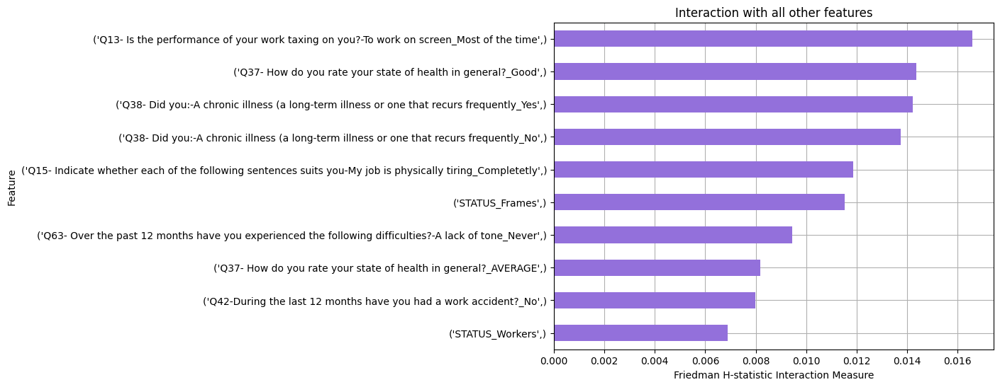

In [9]:
# Overall interactions
# fig, ax = plt.subplots(figsize=(20, 12))
h_stat.plot(vis_type='bar_chart_ova') # (, ax=ax)

# save the plot
plt.savefig('outputs/01_02_hStat/hStat_OverAll.png', bbox_inches='tight')

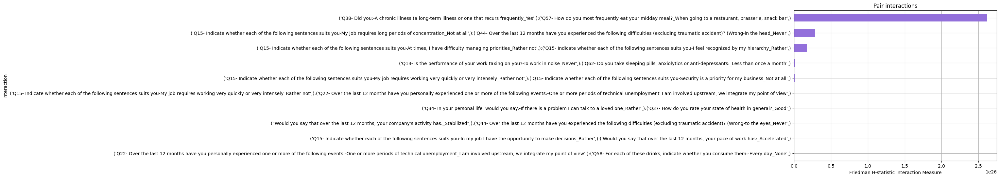

In [10]:
# Pairwise interactions
# fig, ax = plt.subplots(figsize=(20, 12))
h_stat.plot(vis_type='bar_chart') # (, ax=ax)

# save the plot
plt.savefig('outputs/01_02_hStat/hStat_Pairwise.png', bbox_inches='tight')

In [11]:
# Interaction heatmap
h_stat.plot(figsize=(100, 60))

# save the plot
plt.savefig('outputs/01_02_hStat/hStat_Heatmap_normalised.png', bbox_inches='tight')

In [20]:
h_stat.feature_importance[:20]

,Feature,Importance
0,('Q22- Over the last 12 months have you person...,0.010800
1,('Q23- Do you have difficulty reconciling your...,0.008050
2,('Q13- Is the performance of your work taxing ...,0.005850
3,"('Q38- Did you:-Disabilities_No',)",0.005150
4,"('Q2- How old are you?_18 - 30',)",0.004800
5,"('Q38- Did you:-Disabilities_Yes',)",0.004800
6,('Q19- For each of the following points indica...,0.003950
7,('Q13- Is the performance of your work taxing ...,0.003650
8,('Q19- For each of the following points indica...,0.003300
9,('Q38- Did you:-A chronic illness (a long-term...,0.003000


Unnormalised H-Statistic

In [14]:
h_stat_unnormalised = FriedmanHStatisticMethod(normalized=False)
t1 = time()
h_stat_unnormalised.fit(rf, X_exp, show_progress=True)
t2 = time()
print(time_e(t1, t2, 'Friedman H Statistic unnormalised'))

Calculating one vs all interactions: 100%|██████████| 426/426 [16:09<00:00,  2.27s/it]

Elapsed time to compute Friedman H Statistic unnormalised: 181 minutes and 34 seconds


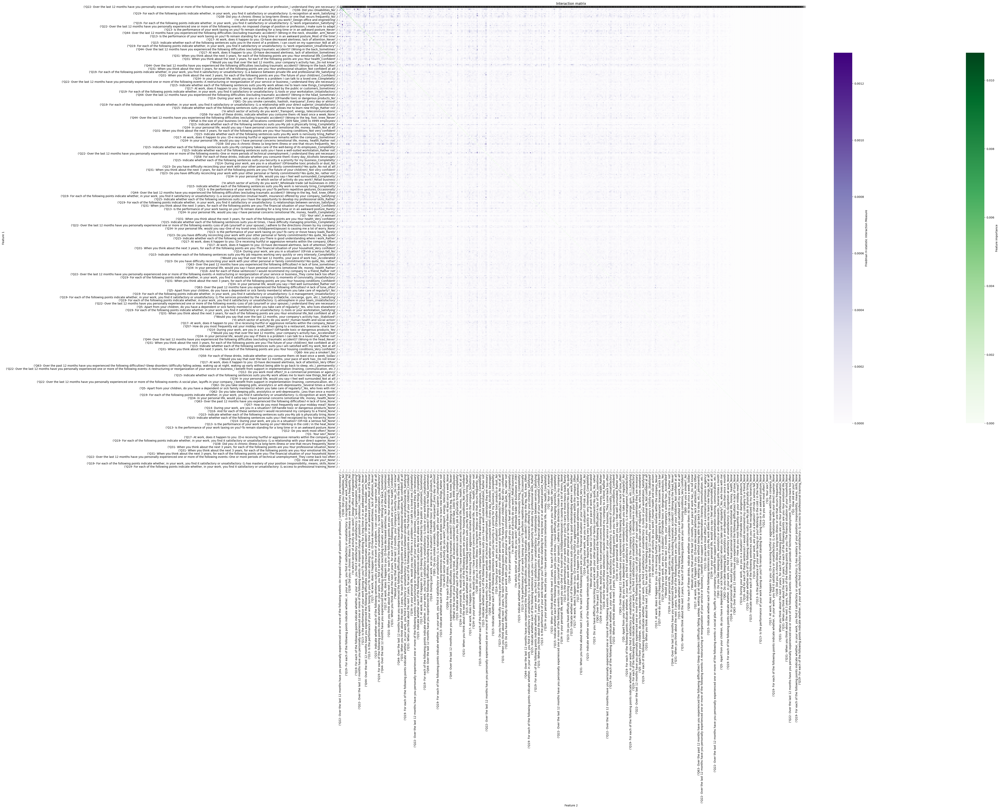

In [15]:
# Plot heatmap
fig, ax = plt.subplots(figsize=(50, 30))
h_stat_unnormalised.plot(ax=ax)

# save the plot
fig.savefig('outputs/01_02_hStat/hStat_heatmap_unnormalised.png', bbox_inches='tight')

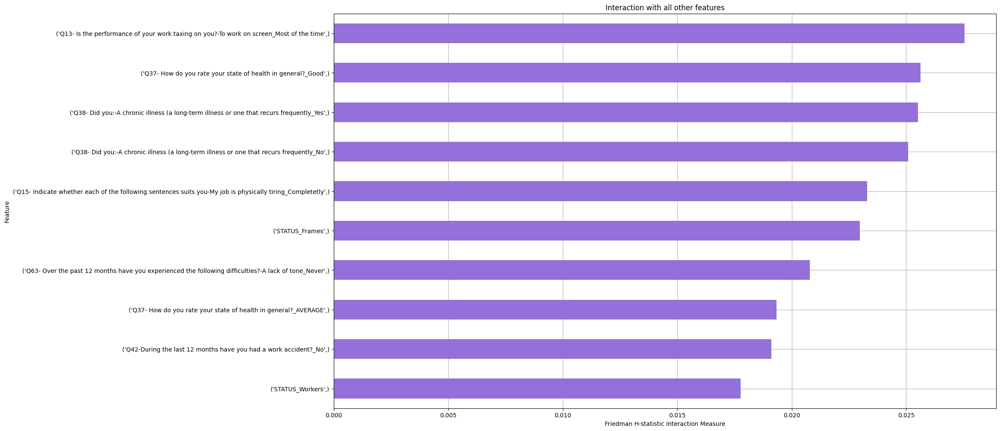

In [16]:
# Plot overall interactions
fig, ax = plt.subplots(figsize=(20, 12))
h_stat_unnormalised.plot(vis_type='bar_chart_ova', ax=ax)

# save the plot
plt.savefig('outputs/01_02_hStat/overall_interactions_unnormalised.png', bbox_inches='tight')

In [17]:
X_exp.columns

Index(['Q4- (3 to 6 years old) In each of the following age groups, how many children live totally or partially with you?',
       'Q4- (7 to 12 years old) In each of the following age groups, how many children live totally or partially with you?',
       'Q4- (13 to 17 years old) In each of the following age groups, how many children live totally or partially with you?',
       'Q4- (18 years and over) In each of the following age groups, how many children live totally or partially with you?',
       '('Q1- Your sex?_A man',)', '('Q1- Your sex?_A woman',)',
       '('Q1- Your sex?_None',)', '('Q2- How old are you?_18 - 30',)',
       '('Q2- How old are you?_30 - 39',)',
       '('Q2- How old are you?_40 - 44',)',
       ...
       '('Q62- Do you take sleeping pills, anxiolytics or anti-depressants:_Several times a month',)',
       '('Q63- Over the past 12 months have you experienced the following difficulties?-Sleep disorders (difficulty falling asleep, waking up at night, waking up 

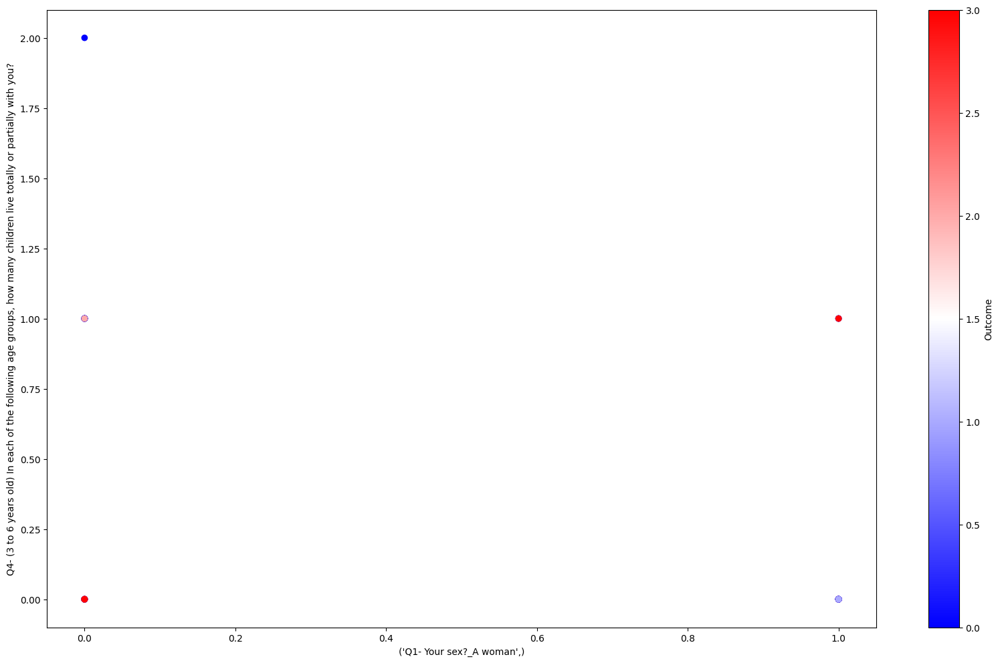

In [18]:
# Interaction between two features
fig, ax = plt.subplots(figsize=(20, 12))
plt.scatter(X_exp["('Q1- Your sex?_A woman',)"], X_exp["Q4- (3 to 6 years old) In each of the following age groups, how many children live totally or partially with you?"], c=y[:100], cmap='bwr')
plt.colorbar(label='Outcome', orientation='vertical')
plt.xlabel("('Q1- Your sex?_A woman',)")
plt.ylabel("Q4- (3 to 6 years old) In each of the following age groups, how many children live totally or partially with you?")
plt.savefig('outputs/01_02_hStat/interaction_between_two_features.png', bbox_inches='tight')

In [19]:
h_stat_unnormalised.feature_importance[:20]

,Feature,Importance
0,('Q22- Over the last 12 months have you person...,0.010800
1,('Q23- Do you have difficulty reconciling your...,0.008050
2,('Q13- Is the performance of your work taxing ...,0.005850
3,"('Q38- Did you:-Disabilities_No',)",0.005150
4,"('Q2- How old are you?_18 - 30',)",0.004800
5,"('Q38- Did you:-Disabilities_Yes',)",0.004800
6,('Q19- For each of the following points indica...,0.003950
7,('Q13- Is the performance of your work taxing ...,0.003650
8,('Q19- For each of the following points indica...,0.003300
9,('Q38- Did you:-A chronic illness (a long-term...,0.003000
